# TODO
- make this prettier
- comment on the auto eda and missing values
- explore missing values usefulness and binning them if they are continuous variables
- explore more in depth variables that looks interesting
- explore the other databases as well

In [1]:
%matplotlib inline
from IPython.display import display, HTML
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import gc

# Basic data reading and handling.

In [2]:
# Looking at all the datafiles.
!ls -lah ./data

total 2.5G
drwxrwxr-x 2 h4pz h4pz 4.0K Jul 14 21:42 .
drwxrwxr-x 4 h4pz h4pz 4.0K Jul 20 21:32 ..
-rw-rw-r-- 1 h4pz h4pz  26M Jun 26 05:04 application_test.csv
-rw-rw-r-- 1 h4pz h4pz 159M Jun 26 05:05 application_train.csv
-rw-rw-r-- 1 h4pz h4pz 359M Jun 26 05:04 bureau_balance.csv
-rw-rw-r-- 1 h4pz h4pz 163M Jun 26 05:04 bureau.csv
-rw-rw-r-- 1 h4pz h4pz 405M Jun 26 05:04 credit_card_balance.csv
-rw-rw-r-- 1 h4pz h4pz  37K Jul 12 21:39 HomeCredit_columns_description.csv
-rw-rw-r-- 1 h4pz h4pz 690M Jun 26 05:05 installments_payments.csv
-rw-rw-r-- 1 h4pz h4pz 375M Jun 26 05:04 POS_CASH_balance.csv
-rw-rw-r-- 1 h4pz h4pz 387M Jun 26 05:05 previous_application.csv
-rw-rw-r-- 1 h4pz h4pz 524K May 17 22:06 sample_submission.csv


In [3]:
# Reading the principal files.
columns_des = pd.read_csv("./data/HomeCredit_columns_description.csv", encoding="ISO-8859-1")
application_train = pd.read_csv("./data/application_train.csv")
application_test = pd.read_csv("./data/application_test.csv")

# Saving the original columns for later (just in case).
train_cols = list(application_train.columns)

In [4]:
# Basic stats of the data nobs.
print("Train shape: {}".format(application_train.shape))
print("Test shape: {}".format(application_test.shape))
print("Train + test nobs: {}".format(application_train.shape[0] + application_test.shape[0]))
print("Test / Train ratio: {:.04f}%".format(100 * application_test.shape[0] / application_train.shape[0]))

Train shape: (307511, 122)
Test shape: (48744, 121)
Train + test nobs: 356255
Test / Train ratio: 15.8511%


In [5]:
# Looking and see the balance / imbalance of the target variable.
ratio = application_train["TARGET"].sum() * 100 / application_train.shape[0]
print(f"Default loan ratio: {ratio:0.4f} % (default loans / total loans)")

Default loan ratio: 8.0729 % (default loans / total loans)


In [6]:
# Concatenating them for general stats and graphs.
temp_test = application_test.copy()
temp_test["TARGET"] = -1  # Indicating this is part of the test data.
applications = pd.concat([application_train, temp_test], axis=0)

# Freeing up memory.
del temp_test
gc.collect()

7

In [7]:
# Peeking into the merged dataframe.
applications.head()

,AMT_ANNUITY,AMT_CREDIT,AMT_GOODS_PRICE,AMT_INCOME_TOTAL,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_YEAR,...,TARGET,TOTALAREA_MODE,WALLSMATERIAL_MODE,WEEKDAY_APPR_PROCESS_START,YEARS_BEGINEXPLUATATION_AVG,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_AVG,YEARS_BUILD_MEDI,YEARS_BUILD_MODE
0,24700.5,406597.5,351000.0,202500.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1,0.0149,"Stone, brick",WEDNESDAY,0.9722,0.9722,0.9722,0.6192,0.6243,0.6341
1,35698.5,1293502.5,1129500.0,270000.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0714,Block,MONDAY,0.9851,0.9851,0.9851,0.7960,0.7987,0.8040
2,6750.0,135000.0,135000.0,67500.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,NaN,NaN,MONDAY,NaN,NaN,NaN,NaN,NaN,NaN
3,29686.5,312682.5,297000.0,135000.0,NaN,NaN,NaN,NaN,NaN,NaN,...,0,NaN,NaN,WEDNESDAY,NaN,NaN,NaN,NaN,NaN,NaN
4,21865.5,513000.0,513000.0,121500.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,NaN,NaN,THURSDAY,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
# Peeking into the description dataframe.
columns_des.head()

,Unnamed: 0,Table,Row,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,Target variable (1 - client with payment diffi...,NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN


In [9]:
# Columns description dataframe shape.
columns_des.shape

(219, 5)

In [10]:
def col_description(col_name):
    """Returns the description of the row in the dataframe df.

    Parameters
    ----------
    row: str.
    
    Return
    ------
    None.
    """
    # Getting the column series.
    col_descriptions = columns_des.loc[columns_des["Row"] == col_name]
    
    # Looping over all the descriptions of the col_name in columns_des.
    for col in range(col_descriptions.shape[0]):
        # Getting the tables where the col_name is found and it's description/s.
        table = col_descriptions["Table"].iloc[col]
        description = col_descriptions["Description"].iloc[col]
        
        # Formating a title for the appeareance of the col_name.
        title = f"<b> Row_name: {col_name} | Table: {table} </b>"
        
        # Printing the title and the description.
        html = HTML(title)
        display(html)
        print(description, "\n")


In [11]:
# Testing the function.
col_description("AMT_CREDIT")

Credit amount of the loan 



Final credit amount on the previous application. This differs from AMT_APPLICATION in a way that the AMT_APPLICATION is the amount for which the client initially applied for, but during our approval process he could have received different amount - AMT_CREDIT 



# EDA of the application{train|test} datasets

### Missing values

Taken from: https://www.kaggle.com/jpmiller/patterns-of-missing-data

#### Basic distribution of the missing values (table and barplot)

In [12]:
# Function for inspecting missing values proportions in a dataframe.
def missing_values_table(df):
    """Function to calculate missing values by column.
    Parameters
    ----------
    df: pd.DataFrame.
    
    Return
    ------
    mis_val_table_ren_columns: pd.DataFrame.
        Dataframe with missing values information.
    """
    # Total missing values
    mis_val = df.isnull().sum()

    # Percentage of missing values
    mis_val_percent = 100 * df.isnull().sum() / len(df)

    # Make a table with the results
    mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)

    # Rename the columns
    mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})

    # Sort the table by percentage of missing descending
    mis_val_table_ren_columns = mis_val_table_ren_columns[
        mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
            '% of Total Values', ascending=False).round(1)

    # Print some summary information
    print(f"Your selected dataframe has {df.shape[1]} columns.")
    print(f"There are {mis_val_table_ren_columns.shape[0]} columns that have missing values.")

    # Return the dataframe with missing information
    return mis_val_table_ren_columns

In [13]:
# Missing values information for the train dataset.
missing_values = missing_values_table(application_train)
missing_values.head(20)

Your selected dataframe has 122 columns.
There are 67 columns that have missing values.


,Missing Values,% of Total Values
COMMONAREA_MEDI,214865,69.9
COMMONAREA_AVG,214865,69.9
COMMONAREA_MODE,214865,69.9
NONLIVINGAPARTMENTS_MEDI,213514,69.4
NONLIVINGAPARTMENTS_MODE,213514,69.4
NONLIVINGAPARTMENTS_AVG,213514,69.4
FONDKAPREMONT_MODE,210295,68.4
LIVINGAPARTMENTS_MODE,210199,68.4
LIVINGAPARTMENTS_MEDI,210199,68.4
LIVINGAPARTMENTS_AVG,210199,68.4


In [14]:
# Missing values information for the test dataset.
missing_values = missing_values_table(application_test)
missing_values.head(20)

Your selected dataframe has 121 columns.
There are 64 columns that have missing values.


,Missing Values,% of Total Values
COMMONAREA_MODE,33495,68.7
COMMONAREA_MEDI,33495,68.7
COMMONAREA_AVG,33495,68.7
NONLIVINGAPARTMENTS_MEDI,33347,68.4
NONLIVINGAPARTMENTS_AVG,33347,68.4
NONLIVINGAPARTMENTS_MODE,33347,68.4
FONDKAPREMONT_MODE,32797,67.3
LIVINGAPARTMENTS_MODE,32780,67.2
LIVINGAPARTMENTS_MEDI,32780,67.2
LIVINGAPARTMENTS_AVG,32780,67.2


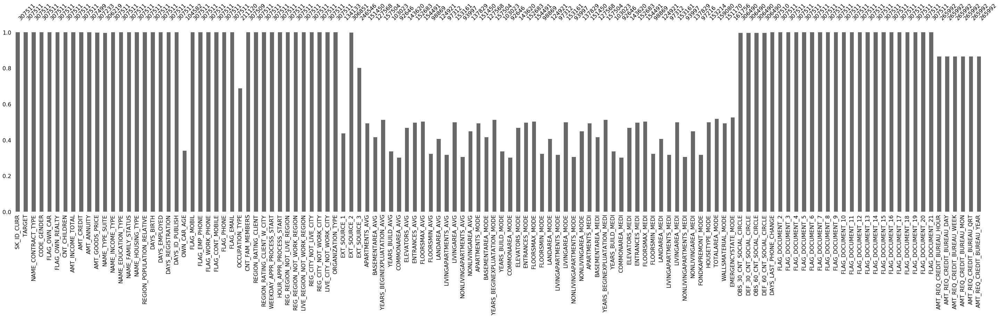

In [15]:
msno.bar(application_train, figsize=(50,10))

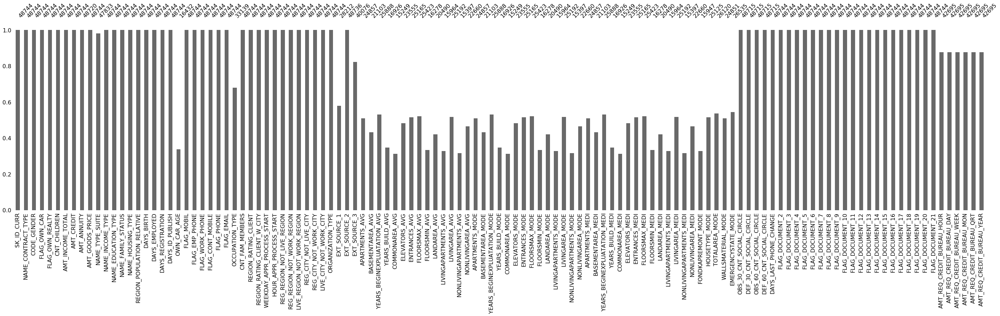

In [16]:
msno.bar(application_test, figsize=(50,10))

#### Description of columns with missing data that are not related to where the client lives

In [17]:
# Example of one of the columns with most missing values that are not related to where they live.
col_description("ORGANIZATION_TYPE")
application_train["ORGANIZATION_TYPE"].unique()

Type of organization where client works 



array(['Business Entity Type 3', 'School', 'Government', 'Religion',
       'Other', 'XNA', 'Electricity', 'Medicine',
       'Business Entity Type 2', 'Self-employed', 'Transport: type 2',
       'Construction', 'Housing', 'Kindergarten', 'Trade: type 7',
       'Industry: type 11', 'Military', 'Services', 'Security Ministries',
       'Transport: type 4', 'Industry: type 1', 'Emergency', 'Security',
       'Trade: type 2', 'University', 'Transport: type 3', 'Police',
       'Business Entity Type 1', 'Postal', 'Industry: type 4',
       'Agriculture', 'Restaurant', 'Culture', 'Hotel',
       'Industry: type 7', 'Trade: type 3', 'Industry: type 3', 'Bank',
       'Industry: type 9', 'Insurance', 'Trade: type 6',
       'Industry: type 2', 'Transport: type 1', 'Industry: type 12',
       'Mobile', 'Trade: type 1', 'Industry: type 5', 'Industry: type 10',
       'Legal Services', 'Advertising', 'Trade: type 5', 'Cleaning',
       'Industry: type 13', 'Trade: type 4', 'Telecom',
       'I

In [18]:
# Example of one of the columns with most missing values that are not related to where they live.
col_description("OWN_CAR_AGE")
application_train["OWN_CAR_AGE"].unique()

Age of client's car 



array([nan, 26., 17.,  8., 23.,  7., 14.,  1.,  3., 13., 10.,  2., 21.,
       20., 22., 65.,  5., 11.,  9.,  4., 15., 12., 25.,  6., 64.,  0.,
       27., 19., 28., 18., 16., 30., 36., 24., 39., 29., 40., 41., 31.,
       42., 37., 35., 34., 33., 54., 38., 32., 43., 55., 49., 44., 63.,
       46., 45., 48., 56., 51., 57., 69., 50., 47., 91., 52.])

In [19]:
# Example of one of the columns with most missing values that are not related to where they live.
col_description("OCCUPATION_TYPE")
application_train["OCCUPATION_TYPE"].unique()

What kind of occupation does the client have 



array(['Laborers', 'Core staff', 'Accountants', 'Managers', nan,
       'Drivers', 'Sales staff', 'Cleaning staff', 'Cooking staff',
       'Private service staff', 'Medicine staff', 'Security staff',
       'High skill tech staff', 'Waiters/barmen staff',
       'Low-skill Laborers', 'Realty agents', 'Secretaries', 'IT staff',
       'HR staff'], dtype=object)

In [20]:
# Example of one of the columns with most missing values that are not related to where they live.
col_description("EXT_SOURCE_1")
application_train["EXT_SOURCE_1"].unique()

Normalized score from external data source 



array([0.08303697, 0.31126731,        nan, ..., 0.14557045, 0.7440264 ,
       0.73445967])

In [21]:
# Example of one of the columns with most missing values that are not related to where they live.
col_description("AMT_REQ_CREDIT_BUREAU_YEAR")
application_train["AMT_REQ_CREDIT_BUREAU_YEAR"].unique()

Number of enquiries to Credit Bureau about the client one day year (excluding last 3 months before application) 



array([ 1.,  0., nan,  2.,  4.,  5.,  3.,  8.,  6.,  9.,  7., 10., 11.,
       13., 16., 12., 25., 23., 15., 14., 22., 17., 19., 18., 21., 20.])

#### Pattern recognition in the missing values

Let's explored the distribution of the missing data

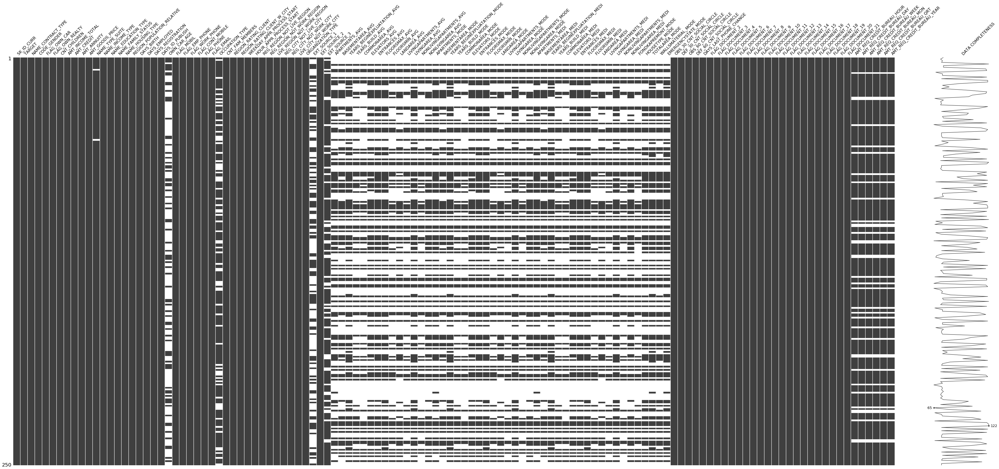

In [22]:
msno.matrix(application_train.sample(250), figsize=(70,30), labels=True)

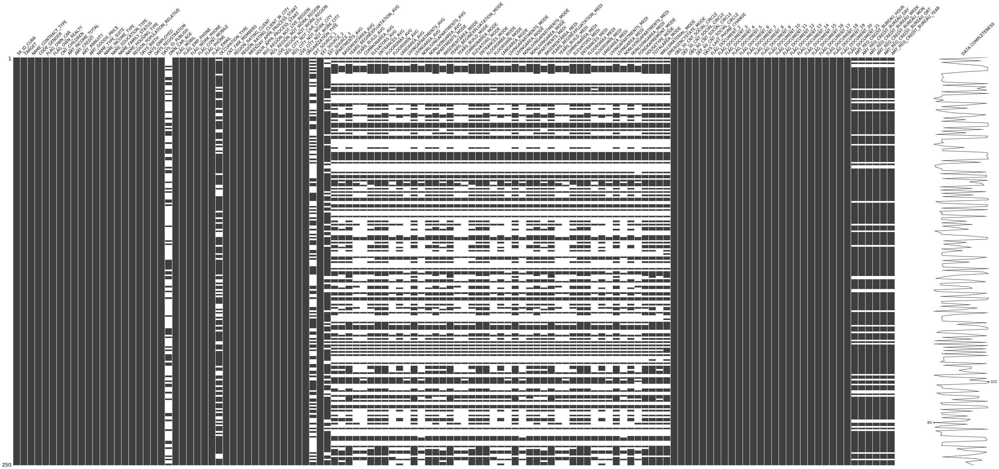

In [23]:
msno.matrix(application_train.sample(250), figsize=(70,30), labels=True)

It looks like there is

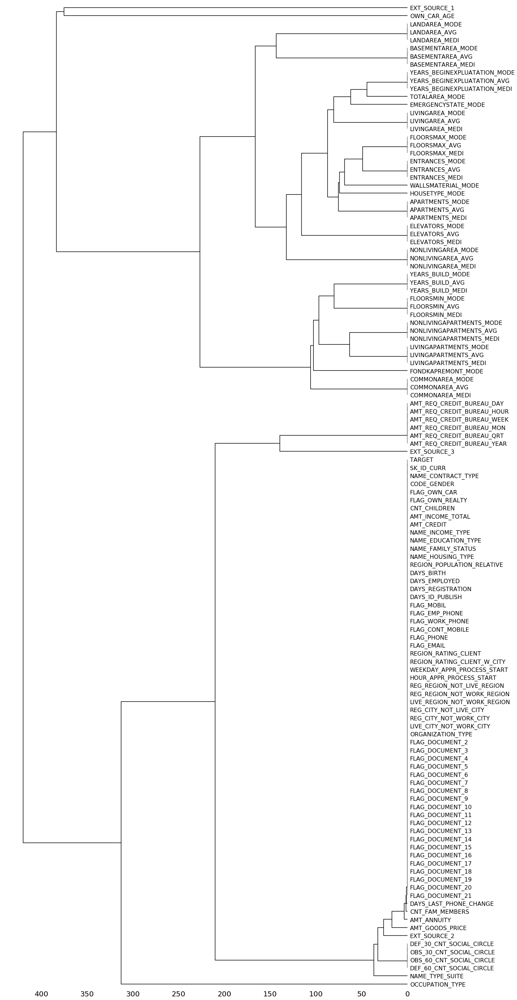

In [24]:
msno.dendrogram(application_train, figsize=(20,50))

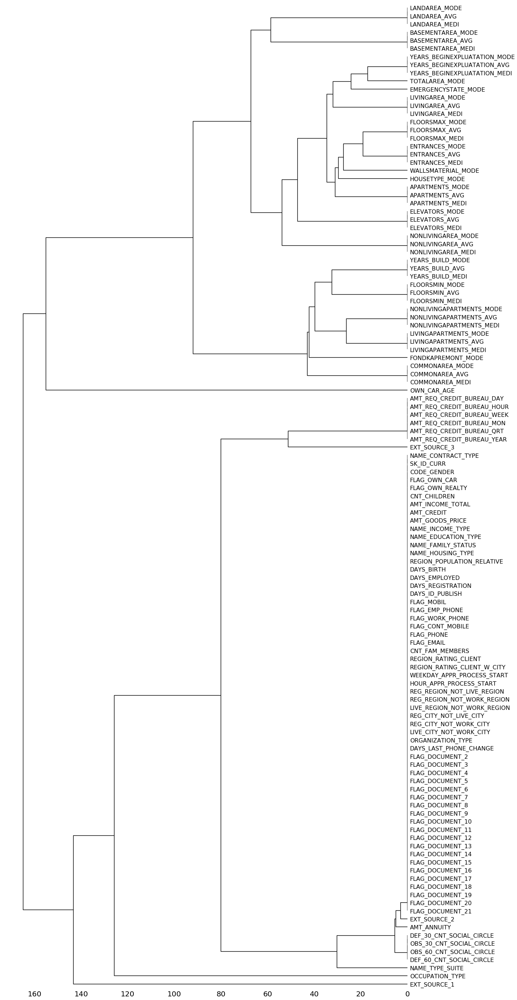

In [25]:
msno.dendrogram(application_test, figsize=(20,50))

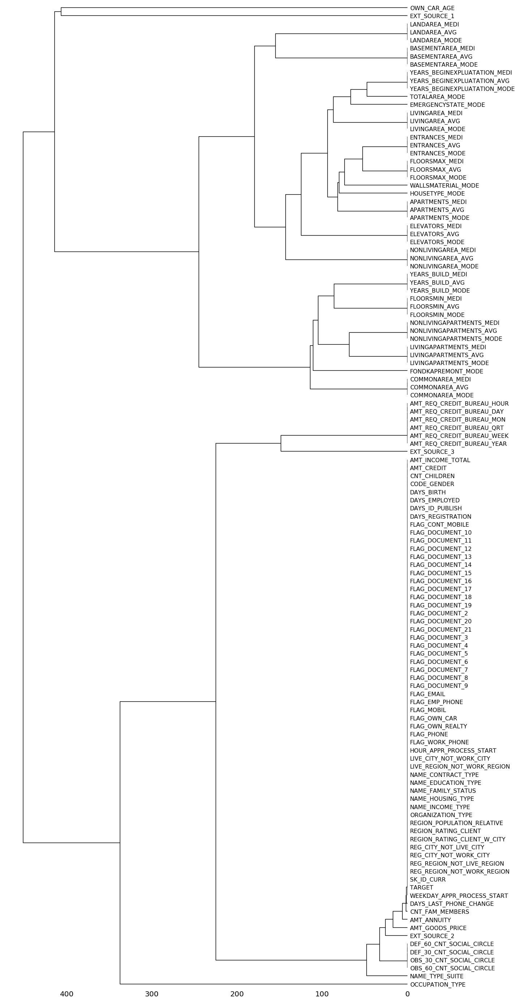

In [26]:
msno.dendrogram(applications, figsize=(20,50))

### Features EDA

#### Column dtypes

In [27]:
# Number of each type of column.
application_train.dtypes.value_counts()

float64    65
int64      41
object     16
dtype: int64

In [28]:
# All variable dtypes.
with pd.option_context('display.max_rows', None, 'display.max_columns', 3):
    print(application_train.dtypes)

SK_ID_CURR                        int64
TARGET                            int64
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                      int64
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
REGION_POPULATION_RELATIVE      float64
DAYS_BIRTH                        int64
DAYS_EMPLOYED                     int64
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                   int64
OWN_CAR_AGE                     float64
FLAG_MOBIL                        int64
FLAG_EMP_PHONE                    int64
FLAG_WORK_PHONE                   int64


In [29]:
# Number of unique classes in each object column.
application_train.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

#### Automatic EDA

**Below are declared some functions in order to do an automatic EDA overview of all of the variables**

In [30]:
def distribution(series, ax=None, figsize=(5,5), var_type="cont"):
    """Plots the distribution of a continuous or categorical variable.
    
    Parameters
    ----------
    series: pd.core.Series
        Pandas series containing the continuous variable.
        
    ax: matplotlib axes
        axes to plot.
    
    figsize: tuple, default (5, 5)
    
    var_type: str
        String that says whether the variables is "cont" or "cat" 
        (continuous / categorical)
    
    Return
    ------
    None
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
    
    if "cont" in var_type:
        sns.distplot(series.dropna(), ax=ax)
    else:
        sns.countplot(series.dropna(), ax=ax)


In [31]:
def distribution_target(train_var, target_var, var_type="cont"):
    """Plots a 1 by 2 figure containing the distribution of the train_var per each target.
    
    Parameters
    ----------
    train_var: pd.core.Series
        Pandas series containing the continuous train variable.
        
    target_var: pd.core.Series
        Pandas series containing the categorical / binary target variable.
        
    var_type: str
        String that says whether the variables is "cont" or "cat" 
        (continuous / categorical) 
        
    Return
    ------
    None
    """
    # Getting some information on how many targets are there.
    unique_target_values = target_var.unique()
    n_unique_target_values = len(unique_target_values)
    
    # Setting which axis to share.
    if "cont" in var_type:
        sharex, sharey = True, True
    else:
        sharex, sharey = True, False
    
    # Building the figure.
    fig, axs = plt.subplots(1, n_unique_target_values, sharex=sharex, sharey=sharey, figsize=(15, 6))
    
    # Setting up the title of the whole graph.
    fig.suptitle(f"Distribution of {train_var.name} over each target", y=0.98, fontsize=14)
    
    for ix, target in enumerate(target_var.unique()):
        # Getting the subset of the train population per unique target.
        train_var_subset = train_var[target_var == target]
        
        # Setting the title of each subplot.
        title = f"Feature: {train_var.name}  | Target: {target}"
        axs[ix].set_title(title)
        
        # Plotting the distribution per feature.
        distribution(train_var_subset, ax=axs[ix], var_type=var_type)


In [32]:
def distribution_train_test(train_var, test_var, var_type="cont"):
    """Plots the distribution of a variable on each train / test set.
    
    Parameters
    ----------
    train_var: pd.core.Series
        Panda series containing the var in the training set to plot.
        
    test_var: pd.core.Series
        Panda series containing the  var in the training set to plot.
    
    Returns
    -------
    None
    """
    # Making the data more friendly for a loop.
    data = (train_var, test_var)
    dataset_names = ("Train", "Test")

    # Setting which axis to share.
    if "cont" in var_type:
        sharex, sharey = True, True
    else:
        sharex, sharey = True, False
    
    # Building the figure.
    fig, axs = plt.subplots(1, 2, sharex=sharex, sharey=sharey, figsize=(15, 6))
    
    # Setting up the title of the whole graph.
    fig.suptitle(
        f"Distribution of {train_var.name} over each dataset (train/test)",
        y=0.98,
        fontsize=14)
    
    for ix in range(2):
        # Setting the title of each subplot.
        title = f"Feature: {data[ix].name}  | Dataset: {dataset_names[ix]}"
        axs[ix].set_title(title)
        
        # Plotting the distribution per feature.
        distribution(data[ix], ax=axs[ix], var_type=var_type)

In [33]:
def auto_eda(train, test, target):
    """Generates an automatic EDA (just distributions and comparisons between them).
    
    Parameters
    ----------
    train: pandas.DataFrame
        Dataframe containing the train data.
        
    test: pandas.DataFrame
        Dataframe containing the test data.
        
    target: pandas.core.Series
        Series containing the target variable.
        
    Return
    ------
    None
    """
    # Getting all columns and categorical variables.
    columns = train.columns
    cat_vars = train.select_dtypes(include="O").columns
    
    for col in columns:
        # Setting the type of variable of col.
        var_type = "cat" if col in cat_vars else "cont"
        
        # Plotting the distribution of the col with respect to the target.
        distribution_target(train[col], target, var_type)
        
        # Plotting the distribution of the col with respect to each data set (train/test).
        distribution_train_test(train[col], test[col], var_type)


/home/h4pz/.conda/envs/ai/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/h4pz/.conda/envs/ai/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:494: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X,a,b,gridsize)/(delta*nobs)
/home/h4pz/.conda/envs/ai/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


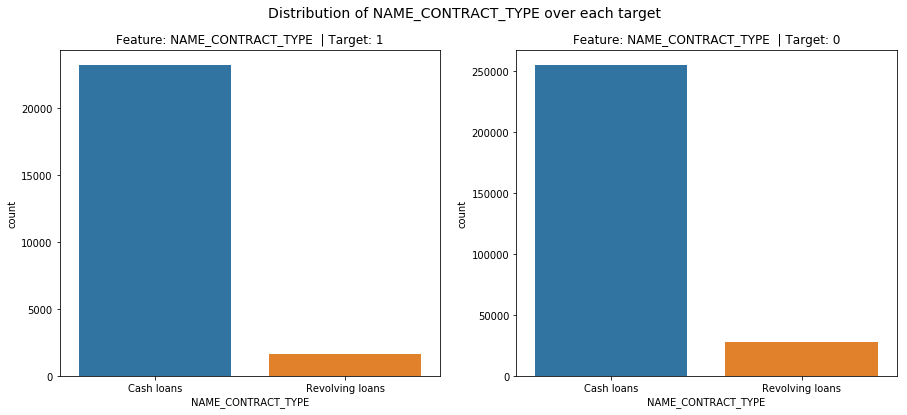

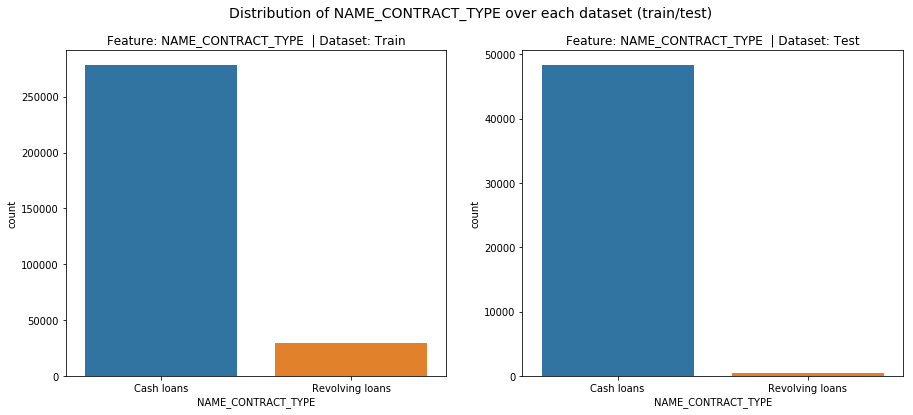

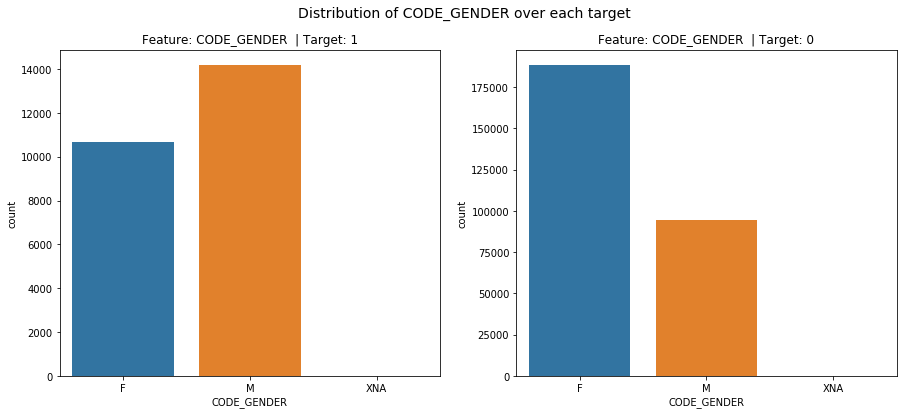

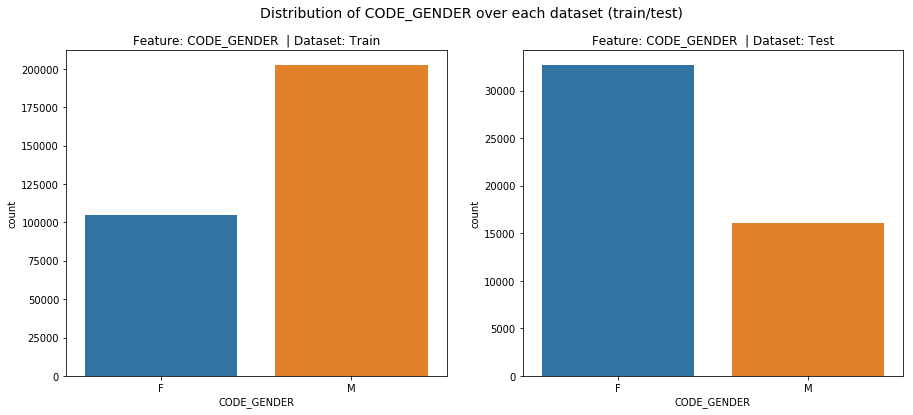

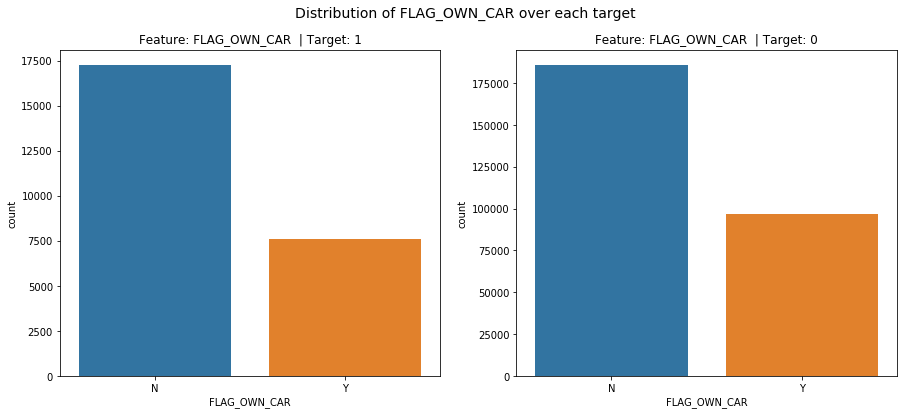

...

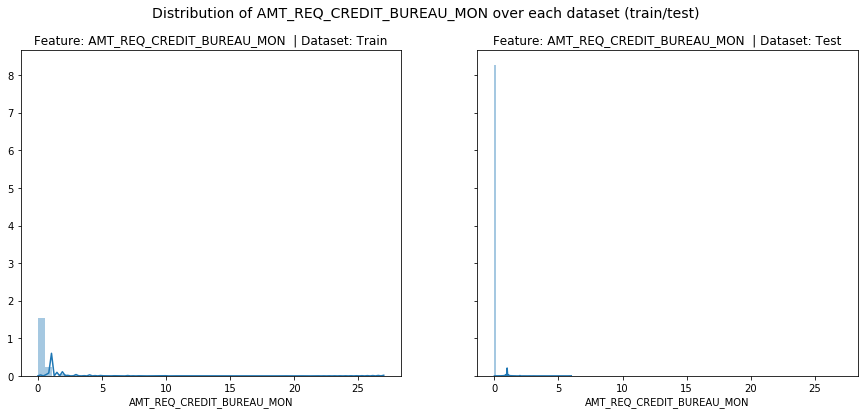

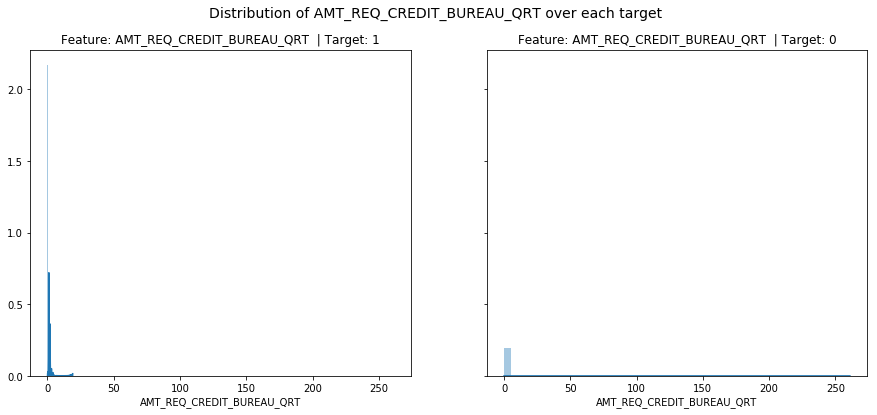

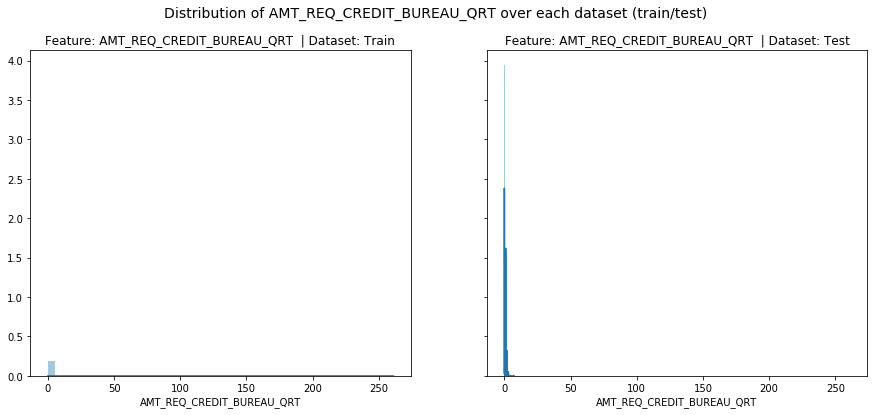

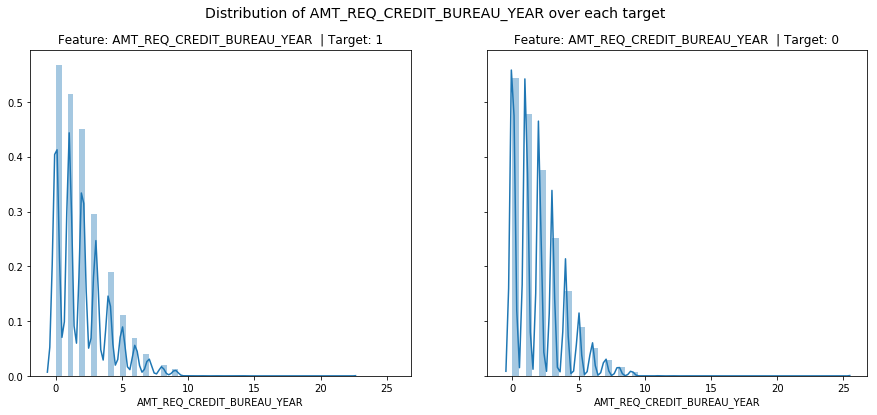

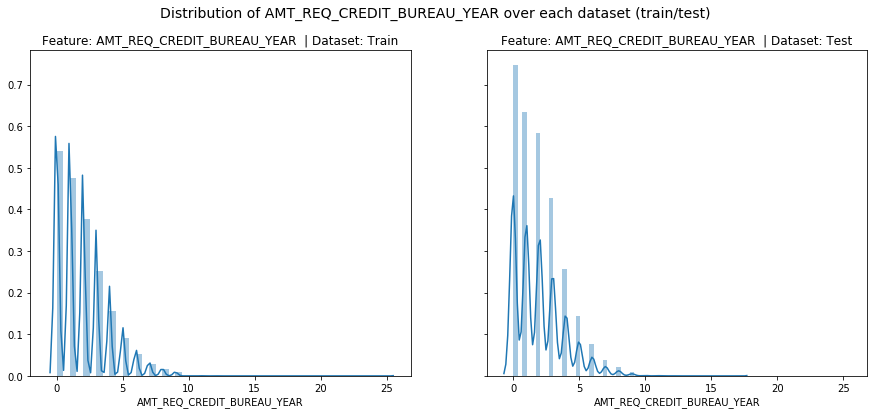

In [34]:
auto_eda(application_train.iloc[:, 2:], application_test.iloc[:, 1:], application_train["TARGET"])

#### TODO

# BASELINE MODEL

In [35]:
import lightgbm as lgb
from sklearn import preprocessing

In [36]:
# Removing the SK_ID_CURR and TARGET columns from the train/test data set and getting the target series.
train = application_train.iloc[:, 2:]
test = application_test.iloc[:, 1:]
target = application_train["TARGET"]

# LGBM needs the the categorical variables to be encoded first.
# so we are going to separate the categorical from the numerical data first.
cat_vars_train = train.select_dtypes(include="O")
cont_vars_train = train.select_dtypes(include=np.number)
cat_vars_test = test.select_dtypes(include="O")
cont_vars_test = test.select_dtypes(include=np.number)

# Then it's time to encode all the categorical features.
# but first we need to replace all numerical nan's with a string
# because the label encoder expects only strings and np.nan is of type float.
cat_vars_train = cat_vars_train.fillna("nan")
encoded_cat_vars_train = cat_vars_train.apply(preprocessing.LabelEncoder().fit_transform)
cat_vars_test = cat_vars_test.fillna("nan")
encoded_cat_vars_test = cat_vars_test.apply(preprocessing.LabelEncoder().fit_transform)

# Now let's merge again all the variables
train = pd.concat([cont_vars_train, encoded_cat_vars_train], axis=1)
test_data = pd.concat([cont_vars_test, encoded_cat_vars_test], axis=1)

# Creating a lgb dataset.
# The datsaset object only works for training, not for predicting
train_data = lgb.Dataset(train, label=target)

# Freeing up memory.
gc.collect()

2156195

In [37]:
# LightGBM parameters.
param = {}
param["objective"] = "binary"
param["metric"] = "auc"
param["random_state"] = 4

In [38]:
# Training.
bst = lgb.train(param, train_data)

In [39]:
# Prediction.
y_hat = bst.predict(test_data)
y_hat = pd.Series(y_hat, name="TARGET").to_frame()

# Submission.
sub = pd.concat([application_test["SK_ID_CURR"], y_hat], axis=1)
sub.head()

,SK_ID_CURR,TARGET
0,100001,0.030858
1,100005,0.093082
2,100013,0.020837
3,100028,0.039809
4,100038,0.145582


In [40]:
sub.to_csv("baseline.csv", index=False)

In [41]:
! kaggle competitions submit -c home-credit-default-risk -f baseline.csv -m baseline-sub

Successfully submitted to Home Credit Default Risk

In [42]:
! kaggle competitions submissions -c home-credit-default-risk

fileName      date                 description   status    publicScore  privateScore  
------------  -------------------  ------------  --------  -----------  ------------  
baseline.csv  2018-07-21 02:35:57  baseline-sub  complete  0.741        None          
